### РОССИЙСКИЙ УНИВЕРСИТЕТ ДРУЖБЫ НАРОДОВ

#### Факультет физико-математических и естественных наук  
#### Кафедра математического моделирования и искусственного интеллекта

## ОТЧЕТ ПО КОНТРОЛЬНОЙ РАБОТЕ № 7


### Дисциплина: Методы машинного обучения

## Москва 2024
***

##### Студент:  Абу Сувейлим М. М.
##### Группа:   НКНбд-01-21

Вариант 21 

1. Набор данных: svhn_cropped 

2. Диапазон классов: 0, 2, 4, 6, 8 

3. Архитектура автокодировщика: CNN 

4. Показатель качества: cреднее квадратичное логарифмическое отклонение (MSLE) для ошибки реконструкции 

5. Показатель качества бинарной классификации: 

F1-мера, равная 2*TP/(2*TP+FP+FN) 

## 1.	Загрузите заданный в индивидуальном задании набор данных с изображениями из Tensorflow Datasets с разбиением на обучающую и тестовую выборки. Оставьте в обучающей и тестовой выборках диапазон классов, указанных в индивидуальном задании. Если изображения цветные (с тремя каналами), то перекодируйте их в одноцветные (оттенки серого).


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.keras as keras
import pandas as pd
import time
import sys
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model
import tensorflow as tf
import tensorflow_datasets as tfds
from PIL import Image, ImageOps
import random

tf.__version__

'2.16.1'

In [2]:
ds, info = tfds.load("svhn_cropped", split=['train', 'test'], with_info=True)
ds

[<_PrefetchDataset element_spec={'image': TensorSpec(shape=(32, 32, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>,
 <_PrefetchDataset element_spec={'image': TensorSpec(shape=(32, 32, 3), dtype=tf.uint8, name=None), 'label': TensorSpec(shape=(), dtype=tf.int64, name=None)}>]

In [3]:
df_train = tfds.as_dataframe(ds[0])
df_test  = tfds.as_dataframe(ds[1])

In [4]:
def plot_random_sample(images):
    n = 10
    imgs = random.sample(list(images), n)

    num_row = 2
    num_col = 5

    fig, axes = plt.subplots(num_row, num_col, figsize=(3.5 * num_col, 3 * num_row))
    # For every image
    for i in range(num_row * num_col):
        # Read the image
        img = imgs[i]
        # Display the image
        ax = axes[i // num_col, i % num_col]
        ax.imshow(img)

    plt.tight_layout()
    plt.show()

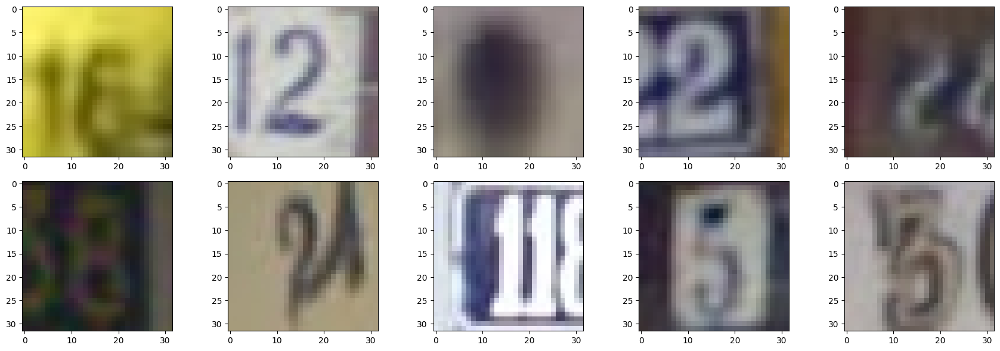

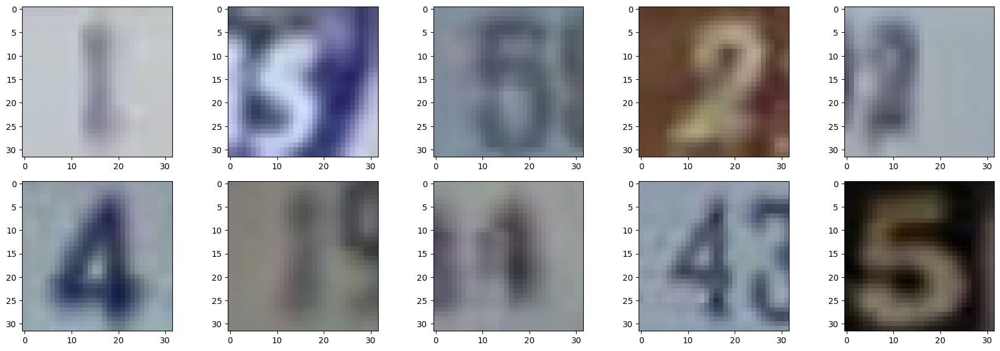

In [5]:
plot_random_sample(df_train['image'])
plot_random_sample(df_test['image'])

In [6]:
# Filter and relabel DataFrames
def filter_and_relabel(df):
    x0 = df[df['label'] == 0]
    x0['label'] = 0
    x1 = df[df['label'] == 2]
    x1['label'] = 1
    x2 = df[df['label'] == 4]
    x2['label'] = 2
    x3 = df[df['label'] == 6]
    x3['label'] = 3
    x4 = df[df['label'] == 8]
    x4['label'] = 4
    return pd.concat([x0, x1, x2, x3, x4])

df_train_ = filter_and_relabel(df_train)
df_test = filter_and_relabel(df_test)

Y_train = df_train['label']
X_train = df_train['image']

Y_test = df_test['label']
X_test = df_test['image']

C:\Users\Mo\AppData\Local\Temp\ipykernel_22096\2923859983.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x0['label'] = 0
C:\Users\Mo\AppData\Local\Temp\ipykernel_22096\2923859983.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x1['label'] = 1
C:\Users\Mo\AppData\Local\Temp\ipykernel_22096\2923859983.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://p

In [ ]:
for i in range(len(X_train)):
  img = Image.fromarray(np.array(X_train.iloc[i]))
  X_train.iloc[i] = np.array(ImageOps.grayscale(img))#,dtype='float32')

for i in range(len(X_test)):
  img = Image.fromarray(np.array(X_test.iloc[i]))
  X_test.iloc[i] = np.array(ImageOps.grayscale(img))#,dtype='float32')

C:\Users\Mo\AppData\Local\Temp\ipykernel_22096\3559432100.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.iloc[i] = np.array(ImageOps.grayscale(img))#,dtype='float32')
C:\Users\Mo\AppData\Local\Temp\ipykernel_22096\3559432100.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.iloc[i] = np.array(ImageOps.grayscale(img))#,dtype='float32')
C:\Users\Mo\AppData\Local\Temp\ipykernel_22096\3559432100.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#re

In [ ]:
X_tr = np.zeros(shape=(X_train.shape[0],32,32), dtype=np.float32)
X_te  = np.zeros(shape=(X_test.shape[0],32,32), dtype=np.float32)
for i in range(len(X_tr)):
    X_tr[i,:,:] = X_train.iloc[i]
for i in range(len(X_te)):
    X_te[i,:,:] = X_test.iloc[i]
X_tr.shape

## 2.	Постройте для набора данных график логарифмического правдоподобия профиля в зависимости от числа главных компонент и определите размерность латентного пространства.

### Логарифмическое правдоподобие профиля

Определим размерность латентного пространства при помощи метода PCA и правдоподобия профиля. Для вычисления логарифмического правдоподобия профиля будем использовать следующую функцию:

Используем небольшую часть набора `svhn_cropped ` для цифры 2: